In [1]:
import os
import shutil
from tqdm.notebook import tqdm
import torch
from torch import nn
from torch.nn import functional as F
import torchvision
from torchvision import transforms
import itertools

from sklearn import metrics
from sklearn.metrics import confusion_matrix
import seaborn as sns
from PIL import Image
from matplotlib import pyplot as plt

import numpy as np
import random
torch.cuda.is_available()

True

In [2]:
class conf_mat:
  
    def __init__(self,test_dataloader,class_names,model_ft):
        self.test_dl = test_dataloader
        self.class_names = class_names
        self.model_ft = model_ft

    def confusion_mat(self):
        
        predlist=torch.zeros(0,dtype=torch.long, device='cpu')
        lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

        with torch.no_grad():
            for i, (inputs, classes) in enumerate(self.test_dl):
                inputs = inputs.to(device)
                classes = classes.to(device)
                outputs = self.model_ft(inputs)
                _, preds = torch.max(outputs, 1)

                # Append batch prediction results
                predlist=torch.cat([predlist,preds.view(-1).cpu()])
                lbllist=torch.cat([lbllist,classes.view(-1).cpu()])

        self.conf_mat= confusion_matrix(lbllist.numpy(), predlist.numpy())

        self.class_accuracy=100*self.conf_mat.diagonal()/self.conf_mat.sum(1)
        print(f"Class accuracy : {self.class_accuracy}")

    def plot_confusion_matrix(self,normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
        cm = self.conf_mat
        classes = self.class_names
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print("Normalized confusion matrix")
        else:

            print('Confusion matrix, without normalization')

        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

        plt.tight_layout()
        plt.ylabel('True label')
        plt.xlabel('Predicted label')

In [3]:
train_dirs = {
    'Rs 10': 'Indian_Rupee_Data/training/10',
    'Rs 20': 'Indian_Rupee_Data/training/20',
    'Rs 50': 'Indian_Rupee_Data/training/50',
    'Rs 100': 'Indian_Rupee_Data/training/100',
    'Rs 200': 'Indian_Rupee_Data/training/200',
    'Rs 500': 'Indian_Rupee_Data/training/500',
    'Rs 2000': 'Indian_Rupee_Data/training/2000',
}
test_dirs = {
    'Rs 10': 'Indian_Rupee_Data/validation/10',
    'Rs 20': 'Indian_Rupee_Data/validation/20',
    'Rs 50': 'Indian_Rupee_Data/validation/50',
    'Rs 100': 'Indian_Rupee_Data/validation/100',
    'Rs 200': 'Indian_Rupee_Data/validation/200',
    'Rs 500': 'Indian_Rupee_Data/validation/500',
    'Rs 2000': 'Indian_Rupee_Data/validation/2000',
}

In [4]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [5]:
class IndCur_Dataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
       
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('jpg')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = ['Rs 10','Rs 20','Rs 50','Rs 100','Rs 200','Rs 500','Rs 2000']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

In [6]:
print("Train Dataset Info ...")
train_dataset = IndCur_Dataset(train_dirs, train_transform)
print("\n")
print("Validation Dataset Info ...")
test_dataset = IndCur_Dataset(test_dirs, test_transform)

Train Dataset Info ...
Found 330 Rs 10 examples
Found 345 Rs 20 examples
Found 329 Rs 50 examples
Found 385 Rs 100 examples
Found 344 Rs 200 examples
Found 347 Rs 500 examples
Found 342 Rs 2000 examples


Validation Dataset Info ...
Found 23 Rs 10 examples
Found 24 Rs 20 examples
Found 24 Rs 50 examples
Found 24 Rs 100 examples
Found 24 Rs 200 examples
Found 24 Rs 500 examples
Found 24 Rs 2000 examples


In [7]:
batch_size = 8

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 303
Number of test batches 21


In [8]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(18, 9))
    images = images.cpu()
    labels = labels.cpu()
    for i, image in enumerate(images):
        plt.subplot(1, 8, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].cpu().numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].cpu().numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

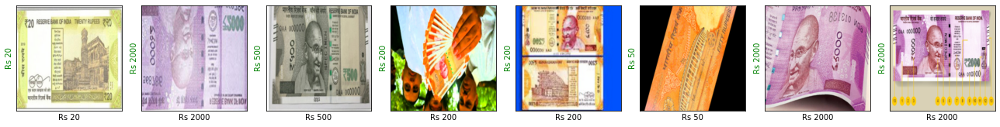

tensor([1, 6, 5, 4, 4, 2, 6, 6])


In [9]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)
print(labels)

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IC_ResNet34 = torchvision.models.resnet34(pretrained=True);

In [11]:
IC_ResNet34.fc = torch.nn.Linear(in_features=512, out_features=7)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(IC_ResNet34.parameters(), lr=1e-5)
IC_ResNet34 = IC_ResNet34.to(device)

In [12]:
def show_preds():
    IC_ResNet34.eval()
    images, labels = next(iter(dl_test))
    images = images.to(device)
    labels = labels.to(device)
    outputs = IC_ResNet34(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

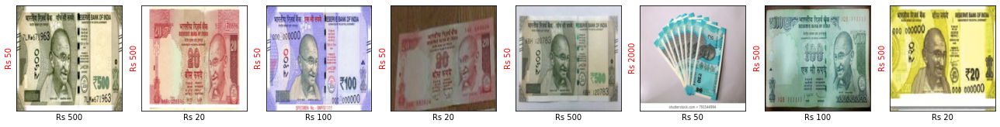

In [13]:
# show preds without any training
show_preds()

In [14]:
def train(epochs):
    
    validation_loss = []
    acc = []
    steps = []
    training_loss = []
    
    print('Starting training..')
    epoch_train_loss = []
    epoch_validation_loss = []
    ep = []
    
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)
        
        train_loss = 0.
        val_loss = 0.
        IC_ResNet34.train()
        
        for train_step, (images, labels) in enumerate(dl_train):
        
            images = images.to(device)
            labels = labels.to(device)
            
            optimizer.zero_grad()
            
            outputs = IC_ResNet34(images)
            loss = loss_fn(outputs, labels)
            
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            
            del labels, images
            torch.cuda.empty_cache()
            
            if train_step % 10 == 0:
                print("Evaluating at step : {}/{}".format(train_step+1,len(dl_train)))
                accuracy = 0

                IC_ResNet34.eval() 

                for val_step, (images, labels) in enumerate(dl_test):
                    
                    images = images.to(device)
                    labels = labels.to(device)
                    
                    outputs = IC_ResNet34(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()
                    _, preds = torch.max(outputs, 1)
                    
                    accuracy += sum((preds == labels).cpu().numpy())
                    
                    del labels, images
                    torch.cuda.empty_cache()

                val_loss /= (val_step + 1)
                validation_loss.append(val_loss)
                accuracy = accuracy/len(test_dataset)
                acc.append(accuracy)
                loss_train = train_loss / (train_step + 1)
                training_loss.append(loss_train)

                print(f'epoch: {e+1}, Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')
                
                
                
                if train_step % 100 == 0 and train_step !=0:
                    plt.figure(figsize = (10,4))
                    plt.subplot(1,3,1)
                    plt.plot(validation_loss)
                    plt.title("Validation Loss, epoch : {}".format(e+1))
                    plt.xlabel('x10 Steps')
                    
                    plt.subplot(1,3,2)
                    plt.plot(training_loss)
                    plt.title("Training Loss, epoch : {}".format(e+1))
                    plt.xlabel('x10 Steps')
                    
                    plt.subplot(1,3,3)
                    plt.plot(acc)
                    plt.title("Accuracy, epoch : {}".format(e+1))
                    plt.xlabel('x10 Steps')
                    plt.tight_layout()
                    show_preds() 

                IC_ResNet34.train()

                if accuracy >= 0.98:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)
        epoch_train_loss.append(train_loss)
        epoch_validation_loss.append(val_loss)
        ep.append(e+1)
        plt.plot(ep,epoch_train_loss)
        plt.plot(ep,epoch_validation_loss)
        plt.xlabel('Epoch')
        plt.legend(["Train Loss", "Validation Loss"])
        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/10
Evaluating at step : 1/303
epoch: 1, Validation Loss: 2.1250, Accuracy: 0.1078
Evaluating at step : 11/303
epoch: 1, Validation Loss: 2.0910, Accuracy: 0.1677
Evaluating at step : 21/303
epoch: 1, Validation Loss: 1.9908, Accuracy: 0.2754
Evaluating at step : 31/303
epoch: 1, Validation Loss: 1.8456, Accuracy: 0.3114
Evaluating at step : 41/303
epoch: 1, Validation Loss: 1.8442, Accuracy: 0.3234
Evaluating at step : 51/303
epoch: 1, Validation Loss: 1.8444, Accuracy: 0.3054
Evaluating at step : 61/303
epoch: 1, Validation Loss: 1.6952, Accuracy: 0.4132
Evaluating at step : 71/303
epoch: 1, Validation Loss: 1.6373, Accuracy: 0.4132
Evaluating at step : 81/303
epoch: 1, Validation Loss: 1.5339, Accuracy: 0.5030
Evaluating at step : 91/303
epoch: 1, Validation Loss: 1.4459, Accuracy: 0.5689
Evaluating at step : 101/303
epoch: 1, Validation Loss: 1.3523, Accuracy: 0.6766


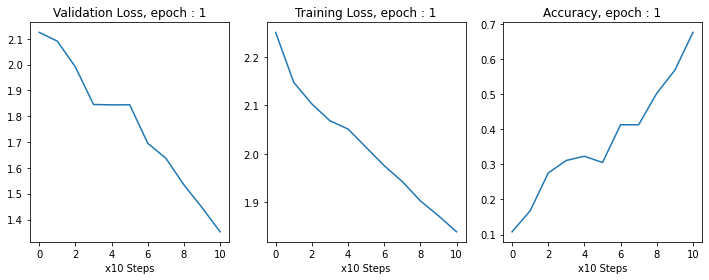

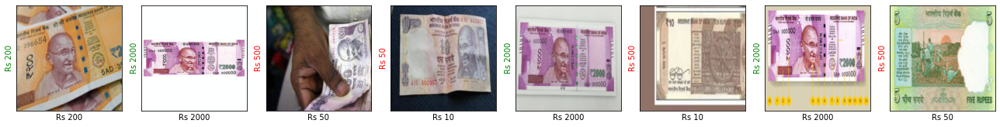

Evaluating at step : 111/303
epoch: 1, Validation Loss: 1.3569, Accuracy: 0.6407
Evaluating at step : 121/303
epoch: 1, Validation Loss: 1.2180, Accuracy: 0.6946
Evaluating at step : 131/303
epoch: 1, Validation Loss: 1.1626, Accuracy: 0.7365
Evaluating at step : 141/303
epoch: 1, Validation Loss: 1.1165, Accuracy: 0.7784
Evaluating at step : 151/303
epoch: 1, Validation Loss: 1.0837, Accuracy: 0.7305
Evaluating at step : 161/303
epoch: 1, Validation Loss: 0.9407, Accuracy: 0.8024
Evaluating at step : 171/303
epoch: 1, Validation Loss: 0.9088, Accuracy: 0.7725
Evaluating at step : 181/303
epoch: 1, Validation Loss: 0.9649, Accuracy: 0.7305
Evaluating at step : 191/303
epoch: 1, Validation Loss: 0.8374, Accuracy: 0.8024
Evaluating at step : 201/303
epoch: 1, Validation Loss: 0.9482, Accuracy: 0.7305


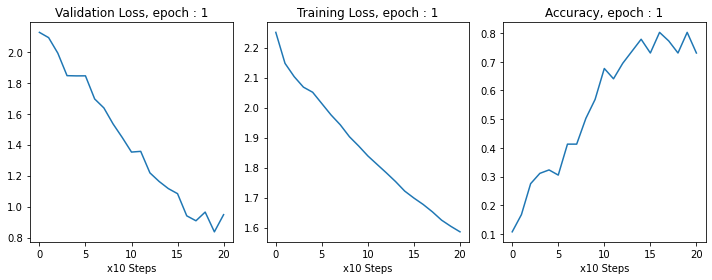

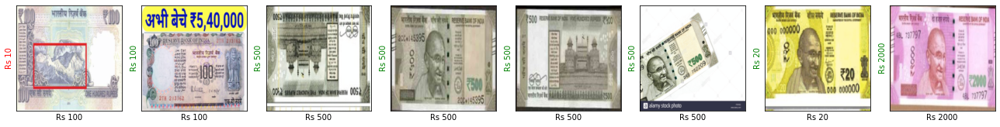

Evaluating at step : 211/303
epoch: 1, Validation Loss: 0.7659, Accuracy: 0.8263
Evaluating at step : 221/303
epoch: 1, Validation Loss: 0.7137, Accuracy: 0.8443
Evaluating at step : 231/303
epoch: 1, Validation Loss: 0.7347, Accuracy: 0.8743
Evaluating at step : 241/303
epoch: 1, Validation Loss: 0.7319, Accuracy: 0.8323
Evaluating at step : 251/303
epoch: 1, Validation Loss: 0.7308, Accuracy: 0.8443
Evaluating at step : 261/303
epoch: 1, Validation Loss: 0.6446, Accuracy: 0.8563
Evaluating at step : 271/303
epoch: 1, Validation Loss: 0.6165, Accuracy: 0.8802
Evaluating at step : 281/303
epoch: 1, Validation Loss: 0.5234, Accuracy: 0.9162
Evaluating at step : 291/303
epoch: 1, Validation Loss: 0.5559, Accuracy: 0.8922
Evaluating at step : 301/303
epoch: 1, Validation Loss: 0.5883, Accuracy: 0.8503


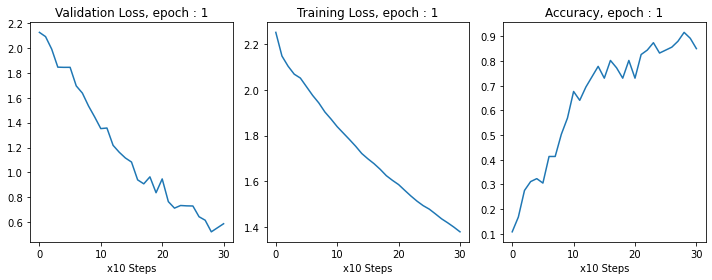

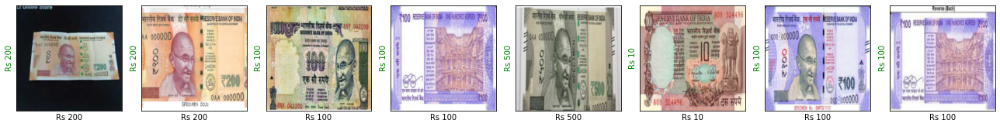

Training Loss: 1.3766
Starting epoch 2/10
Evaluating at step : 1/303
epoch: 2, Validation Loss: 0.5282, Accuracy: 0.8443
Evaluating at step : 11/303
epoch: 2, Validation Loss: 0.6027, Accuracy: 0.8144
Evaluating at step : 21/303
epoch: 2, Validation Loss: 0.5114, Accuracy: 0.8862
Evaluating at step : 31/303
epoch: 2, Validation Loss: 0.5392, Accuracy: 0.8383
Evaluating at step : 41/303
epoch: 2, Validation Loss: 0.5595, Accuracy: 0.8503
Evaluating at step : 51/303
epoch: 2, Validation Loss: 0.4222, Accuracy: 0.9042
Evaluating at step : 61/303
epoch: 2, Validation Loss: 0.5129, Accuracy: 0.8623
Evaluating at step : 71/303
epoch: 2, Validation Loss: 0.5560, Accuracy: 0.8084
Evaluating at step : 81/303
epoch: 2, Validation Loss: 0.4582, Accuracy: 0.8743
Evaluating at step : 91/303
epoch: 2, Validation Loss: 0.3945, Accuracy: 0.9222
Evaluating at step : 101/303
epoch: 2, Validation Loss: 0.5217, Accuracy: 0.8383


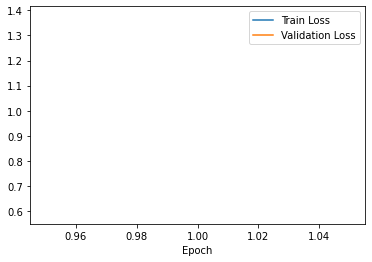

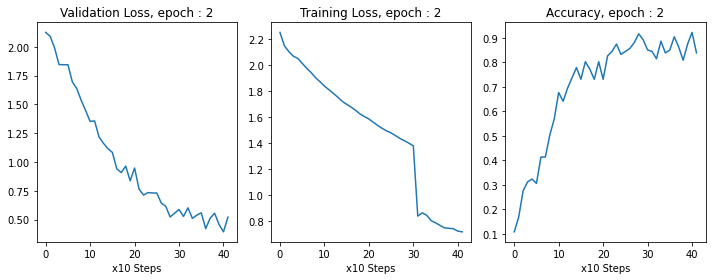

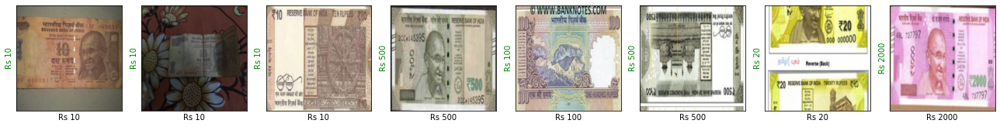

Evaluating at step : 111/303
epoch: 2, Validation Loss: 0.4493, Accuracy: 0.8503
Evaluating at step : 121/303
epoch: 2, Validation Loss: 0.3917, Accuracy: 0.9281
Evaluating at step : 131/303
epoch: 2, Validation Loss: 0.3858, Accuracy: 0.8802
Evaluating at step : 141/303
epoch: 2, Validation Loss: 0.3376, Accuracy: 0.9222
Evaluating at step : 151/303
epoch: 2, Validation Loss: 0.3323, Accuracy: 0.9162
Evaluating at step : 161/303
epoch: 2, Validation Loss: 0.3101, Accuracy: 0.9341
Evaluating at step : 171/303
epoch: 2, Validation Loss: 0.3475, Accuracy: 0.9042
Evaluating at step : 181/303
epoch: 2, Validation Loss: 0.3042, Accuracy: 0.9401
Evaluating at step : 191/303
epoch: 2, Validation Loss: 0.3312, Accuracy: 0.9281
Evaluating at step : 201/303
epoch: 2, Validation Loss: 0.3253, Accuracy: 0.9102


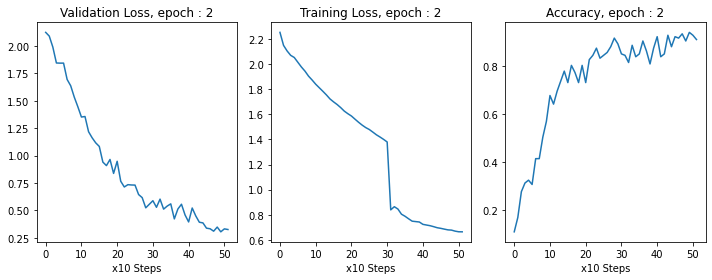

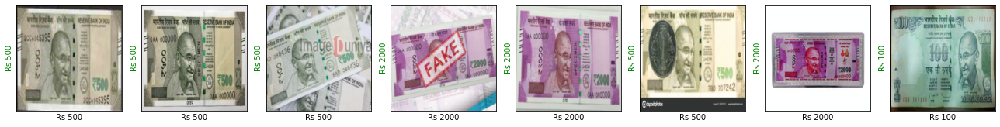

Evaluating at step : 211/303
epoch: 2, Validation Loss: 0.3136, Accuracy: 0.9162
Evaluating at step : 221/303
epoch: 2, Validation Loss: 0.3019, Accuracy: 0.9341
Evaluating at step : 231/303
epoch: 2, Validation Loss: 0.3230, Accuracy: 0.9162
Evaluating at step : 241/303
epoch: 2, Validation Loss: 0.2950, Accuracy: 0.9162
Evaluating at step : 251/303
epoch: 2, Validation Loss: 0.2349, Accuracy: 0.9521
Evaluating at step : 261/303
epoch: 2, Validation Loss: 0.2238, Accuracy: 0.9701
Evaluating at step : 271/303
epoch: 2, Validation Loss: 0.2616, Accuracy: 0.9581
Evaluating at step : 281/303
epoch: 2, Validation Loss: 0.2778, Accuracy: 0.9461
Evaluating at step : 291/303
epoch: 2, Validation Loss: 0.2762, Accuracy: 0.9102
Evaluating at step : 301/303
epoch: 2, Validation Loss: 0.2212, Accuracy: 0.9521


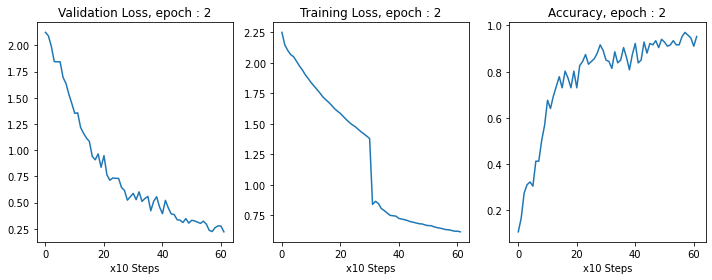

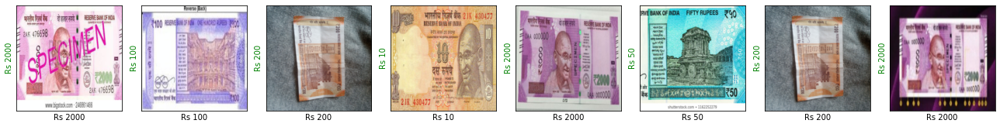

Training Loss: 0.6135
Starting epoch 3/10
Evaluating at step : 1/303
epoch: 3, Validation Loss: 0.2170, Accuracy: 0.9222
Evaluating at step : 11/303
epoch: 3, Validation Loss: 0.2154, Accuracy: 0.9641
Evaluating at step : 21/303
epoch: 3, Validation Loss: 0.2292, Accuracy: 0.9401
Evaluating at step : 31/303
epoch: 3, Validation Loss: 0.2147, Accuracy: 0.9461
Evaluating at step : 41/303
epoch: 3, Validation Loss: 0.2104, Accuracy: 0.9401
Evaluating at step : 51/303
epoch: 3, Validation Loss: 0.2054, Accuracy: 0.9581
Evaluating at step : 61/303
epoch: 3, Validation Loss: 0.2236, Accuracy: 0.9461
Evaluating at step : 71/303
epoch: 3, Validation Loss: 0.1729, Accuracy: 0.9641
Evaluating at step : 81/303
epoch: 3, Validation Loss: 0.1830, Accuracy: 0.9760
Evaluating at step : 91/303
epoch: 3, Validation Loss: 0.2479, Accuracy: 0.9341
Evaluating at step : 101/303
epoch: 3, Validation Loss: 0.2064, Accuracy: 0.9521


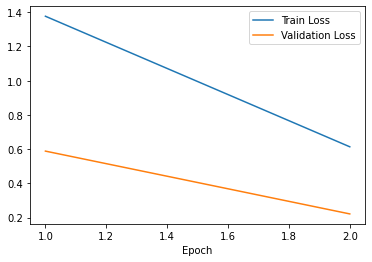

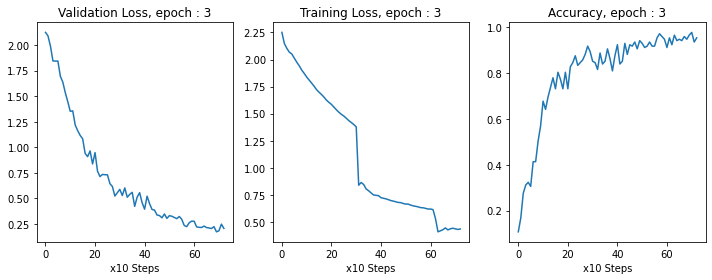

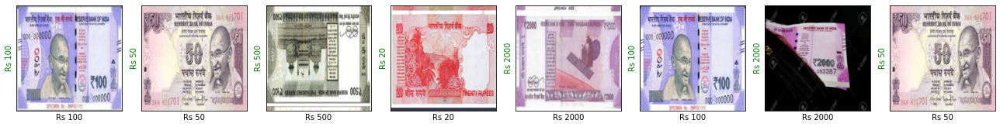

Evaluating at step : 111/303
epoch: 3, Validation Loss: 0.2260, Accuracy: 0.9581
Evaluating at step : 121/303
epoch: 3, Validation Loss: 0.1708, Accuracy: 0.9641
Evaluating at step : 131/303
epoch: 3, Validation Loss: 0.2064, Accuracy: 0.9461
Evaluating at step : 141/303
epoch: 3, Validation Loss: 0.1760, Accuracy: 0.9641
Evaluating at step : 151/303
epoch: 3, Validation Loss: 0.1817, Accuracy: 0.9701
Evaluating at step : 161/303
epoch: 3, Validation Loss: 0.2416, Accuracy: 0.9281
Evaluating at step : 171/303
epoch: 3, Validation Loss: 0.2952, Accuracy: 0.9281
Evaluating at step : 181/303
epoch: 3, Validation Loss: 0.1811, Accuracy: 0.9701
Evaluating at step : 191/303
epoch: 3, Validation Loss: 0.1694, Accuracy: 0.9581
Evaluating at step : 201/303
epoch: 3, Validation Loss: 0.2035, Accuracy: 0.9581


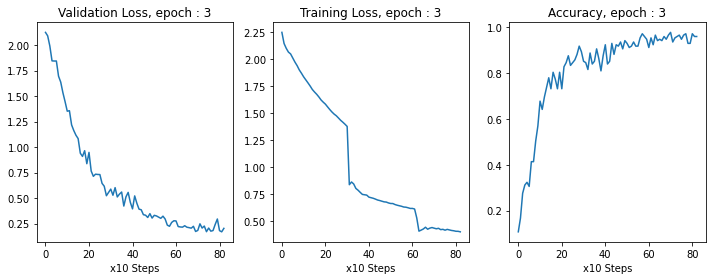

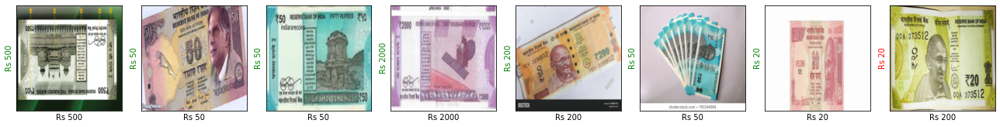

Evaluating at step : 211/303
epoch: 3, Validation Loss: 0.1890, Accuracy: 0.9401
Evaluating at step : 221/303
epoch: 3, Validation Loss: 0.2199, Accuracy: 0.9581
Evaluating at step : 231/303
epoch: 3, Validation Loss: 0.1990, Accuracy: 0.9521
Evaluating at step : 241/303
epoch: 3, Validation Loss: 0.1734, Accuracy: 0.9581
Evaluating at step : 251/303
epoch: 3, Validation Loss: 0.1837, Accuracy: 0.9581
Evaluating at step : 261/303
epoch: 3, Validation Loss: 0.2283, Accuracy: 0.9401
Evaluating at step : 271/303
epoch: 3, Validation Loss: 0.2260, Accuracy: 0.9341
Evaluating at step : 281/303
epoch: 3, Validation Loss: 0.1687, Accuracy: 0.9341
Evaluating at step : 291/303
epoch: 3, Validation Loss: 0.2736, Accuracy: 0.9102
Evaluating at step : 301/303
epoch: 3, Validation Loss: 0.1796, Accuracy: 0.9521


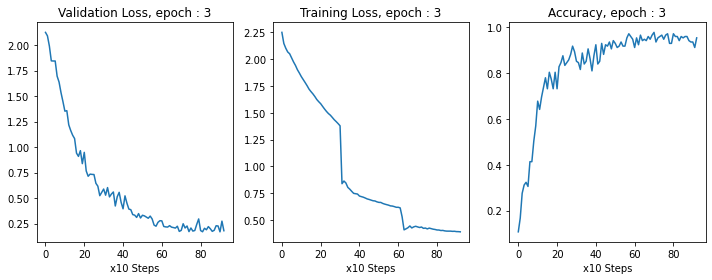

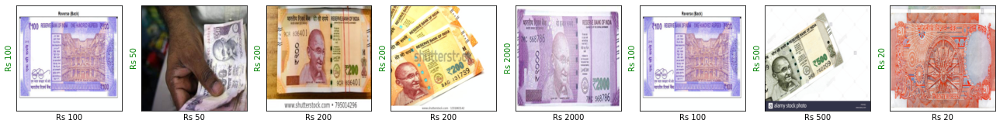

Training Loss: 0.3912
Starting epoch 4/10
Evaluating at step : 1/303
epoch: 4, Validation Loss: 0.1891, Accuracy: 0.9641
Evaluating at step : 11/303
epoch: 4, Validation Loss: 0.1627, Accuracy: 0.9581
Evaluating at step : 21/303
epoch: 4, Validation Loss: 0.2396, Accuracy: 0.9461
Evaluating at step : 31/303
epoch: 4, Validation Loss: 0.1538, Accuracy: 0.9521
Evaluating at step : 41/303
epoch: 4, Validation Loss: 0.1537, Accuracy: 0.9581
Evaluating at step : 51/303
epoch: 4, Validation Loss: 0.1380, Accuracy: 0.9581
Evaluating at step : 61/303
epoch: 4, Validation Loss: 0.1493, Accuracy: 0.9701
Evaluating at step : 71/303
epoch: 4, Validation Loss: 0.1569, Accuracy: 0.9521
Evaluating at step : 81/303
epoch: 4, Validation Loss: 0.1573, Accuracy: 0.9461
Evaluating at step : 91/303
epoch: 4, Validation Loss: 0.2316, Accuracy: 0.9281
Evaluating at step : 101/303
epoch: 4, Validation Loss: 0.1589, Accuracy: 0.9521


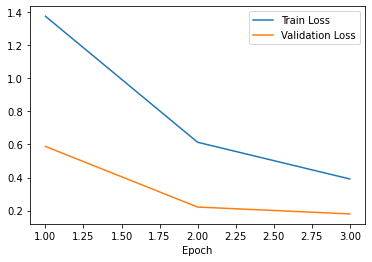

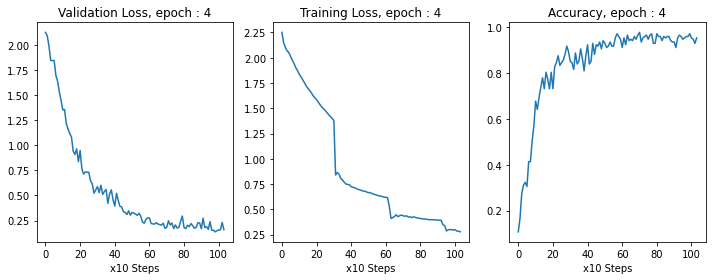

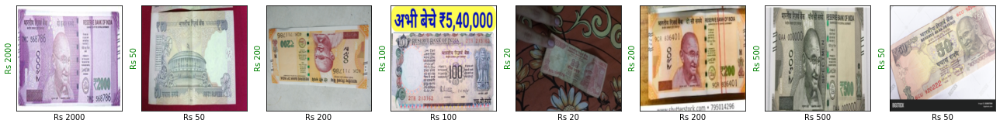

Evaluating at step : 111/303
epoch: 4, Validation Loss: 0.1253, Accuracy: 0.9701
Evaluating at step : 121/303
epoch: 4, Validation Loss: 0.1453, Accuracy: 0.9641
Evaluating at step : 131/303
epoch: 4, Validation Loss: 0.1107, Accuracy: 0.9641
Evaluating at step : 141/303
epoch: 4, Validation Loss: 0.1177, Accuracy: 0.9701
Evaluating at step : 151/303
epoch: 4, Validation Loss: 0.1426, Accuracy: 0.9461
Evaluating at step : 161/303
epoch: 4, Validation Loss: 0.2022, Accuracy: 0.9401
Evaluating at step : 171/303
epoch: 4, Validation Loss: 0.1381, Accuracy: 0.9641
Evaluating at step : 181/303
epoch: 4, Validation Loss: 0.1850, Accuracy: 0.9641
Evaluating at step : 191/303
epoch: 4, Validation Loss: 0.1107, Accuracy: 0.9701
Evaluating at step : 201/303
epoch: 4, Validation Loss: 0.1293, Accuracy: 0.9521


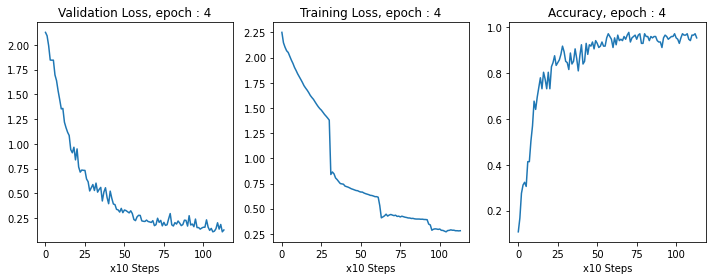

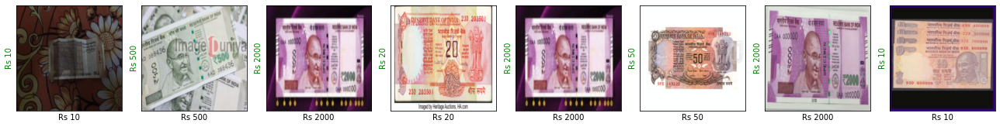

Evaluating at step : 211/303
epoch: 4, Validation Loss: 0.1063, Accuracy: 0.9701
Evaluating at step : 221/303
epoch: 4, Validation Loss: 0.1243, Accuracy: 0.9641
Evaluating at step : 231/303
epoch: 4, Validation Loss: 0.1449, Accuracy: 0.9461
Evaluating at step : 241/303
epoch: 4, Validation Loss: 0.0989, Accuracy: 0.9701
Evaluating at step : 251/303
epoch: 4, Validation Loss: 0.1751, Accuracy: 0.9401
Evaluating at step : 261/303
epoch: 4, Validation Loss: 0.2114, Accuracy: 0.9341
Evaluating at step : 271/303
epoch: 4, Validation Loss: 0.1269, Accuracy: 0.9521
Evaluating at step : 281/303
epoch: 4, Validation Loss: 0.1024, Accuracy: 0.9701
Evaluating at step : 291/303
epoch: 4, Validation Loss: 0.0907, Accuracy: 0.9760
Evaluating at step : 301/303
epoch: 4, Validation Loss: 0.0566, Accuracy: 0.9880


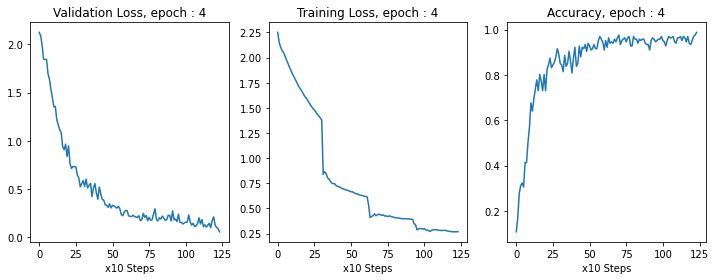

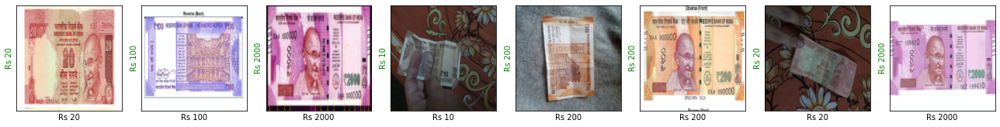

Performance condition satisfied, stopping..
Wall time: 16min 21s


In [15]:
%%time

train(epochs=10)

Classes : ['Rs 10', 'Rs 20', 'Rs 50', 'Rs 100', 'Rs 200', 'Rs 500', 'Rs 2000']
Class accuracy : [ 96.2962963   87.87878788  88.88888889  90.90909091  91.66666667
 100.         100.        ]
Confusion matrix, without normalization


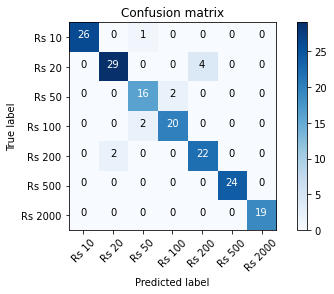

In [16]:
class_names = train_dataset.class_names
cf = conf_mat(dl_test,class_names,IC_ResNet34)
print(f'Classes : {class_names}')
cf.confusion_mat()
cf.plot_confusion_matrix()

In [17]:
checkpoint = {
    'epoch': 4,
    'state_dict': IC_ResNet34.state_dict(),
    'optimizer': optimizer.state_dict()
}

In [18]:
torch.save(checkpoint,'IC_ResNet34_9880.pth')